<a href="https://colab.research.google.com/github/Miller76lite/GEOL558/blob/main/Unsupervised_Final_pass.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Unsupervised Model:
###Methods used are KMeans, PCA, and Gaussian Mixture. KMeans score was used for scoring.
#Dataset:
###This dataset contains boreholes, depths, mineral compounds, and ICP data of various rare earth elements (REE) found in the Thaba Mine in the Bushveld Complex.
#Purpose:
###To determine if the unsupervised models can identify any unique trends or clusters in the borehole data.

Import the required libraries, import and scale the dataset.

In [2]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
Thaba = pd.read_csv('https://raw.githubusercontent.com/Miller76lite/GEOL558/main/DataSet_Thaba_Classification.csv')

We will check the data for any missing values and impute the mean. Then, we will standardize and scale the data to work with the methods below (KMeans, PCA, Gaussian Mixture).

In [4]:

# Check for missing values before imputation
print("Missing values before imputation:\n", Thaba.isnull().sum())
# Select numerical features
numerical_features = Thaba.select_dtypes(include=np.number).columns
Thaba_numerical = Thaba[numerical_features]

# Handle missing values by imputing with the mean
imputer = SimpleImputer(strategy='mean')
Thaba_imputed = imputer.fit_transform(Thaba_numerical)

# Data preprocessing (e.g., standardization)
scaler = StandardScaler()
Thaba_scaled = scaler.fit_transform(Thaba_imputed)

# Check for missing values after imputation
Thaba_imputed_df = pd.DataFrame(Thaba_imputed, columns=numerical_features)  # Convert to DataFrame
print("Missing values after imputation:\n", Thaba_imputed_df.isnull().sum())

Missing values before imputation:
 ProjectCode      0
BH_ID            0
Motherhole       0
HoleType         0
MaxDepth         0
DepthFrom        0
DepthTo          0
Date             0
Cr2O3_%         79
FeO_%           80
SiO2_%          79
MgO_%           79
Al2O3_%         80
CaO_%           79
P_%             80
Au_ICP_ppm       0
Pt_ICP_ppm       0
Pd_ICP_ppm       0
Rh_ICP_ppm       0
Ir_ICP_ppm       0
Ru_ICP_ppm       0
Stratigraphy     0
Filter           0
dtype: int64
Missing values after imputation:
 MaxDepth      0
DepthFrom     0
DepthTo       0
Cr2O3_%       0
FeO_%         0
SiO2_%        0
MgO_%         0
Al2O3_%       0
CaO_%         0
P_%           0
Au_ICP_ppm    0
Pt_ICP_ppm    0
Pd_ICP_ppm    0
Rh_ICP_ppm    0
Ir_ICP_ppm    0
Ru_ICP_ppm    0
Filter        0
dtype: int64


In [ ]:
# Calculate and display the percentage of missing values for each feature
missing_percentage = Thaba.isnull().sum() / len(Thaba) * 100
print("Percentage of missing values:\n", missing_percentage)

Percentage of missing values:
 ProjectCode     0.000000
BH_ID           0.000000
Motherhole      0.000000
HoleType        0.000000
MaxDepth        0.000000
DepthFrom       0.000000
DepthTo         0.000000
Date            0.000000
Cr2O3_%         6.556017
FeO_%           6.639004
SiO2_%          6.556017
MgO_%           6.556017
Al2O3_%         6.639004
CaO_%           6.556017
P_%             6.639004
Au_ICP_ppm      0.000000
Pt_ICP_ppm      0.000000
Pd_ICP_ppm      0.000000
Rh_ICP_ppm      0.000000
Ir_ICP_ppm      0.000000
Ru_ICP_ppm      0.000000
Stratigraphy    0.000000
Filter          0.000000
dtype: float64


Scaling significantly impacts the data distribution, although the changes in individual histograms might appear subtle. Observe the "Thaba.describe" and "Thaba_scaled.describe" outputs below the histograms to see the drastic change in value ranges. While focusing on the original values may not be as informative after scaling, the relationships between features are preserved and often enhanced. This is crucial for many machine learning algorithms that are sensitive to the scale of features.

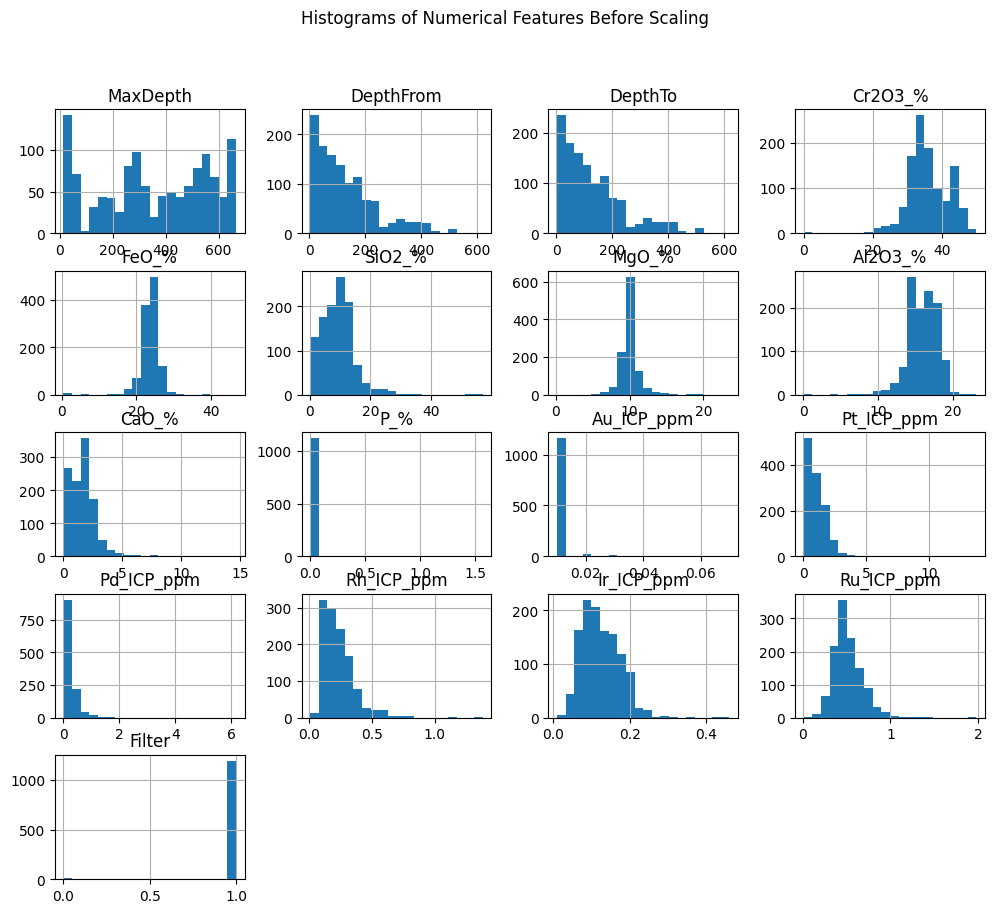

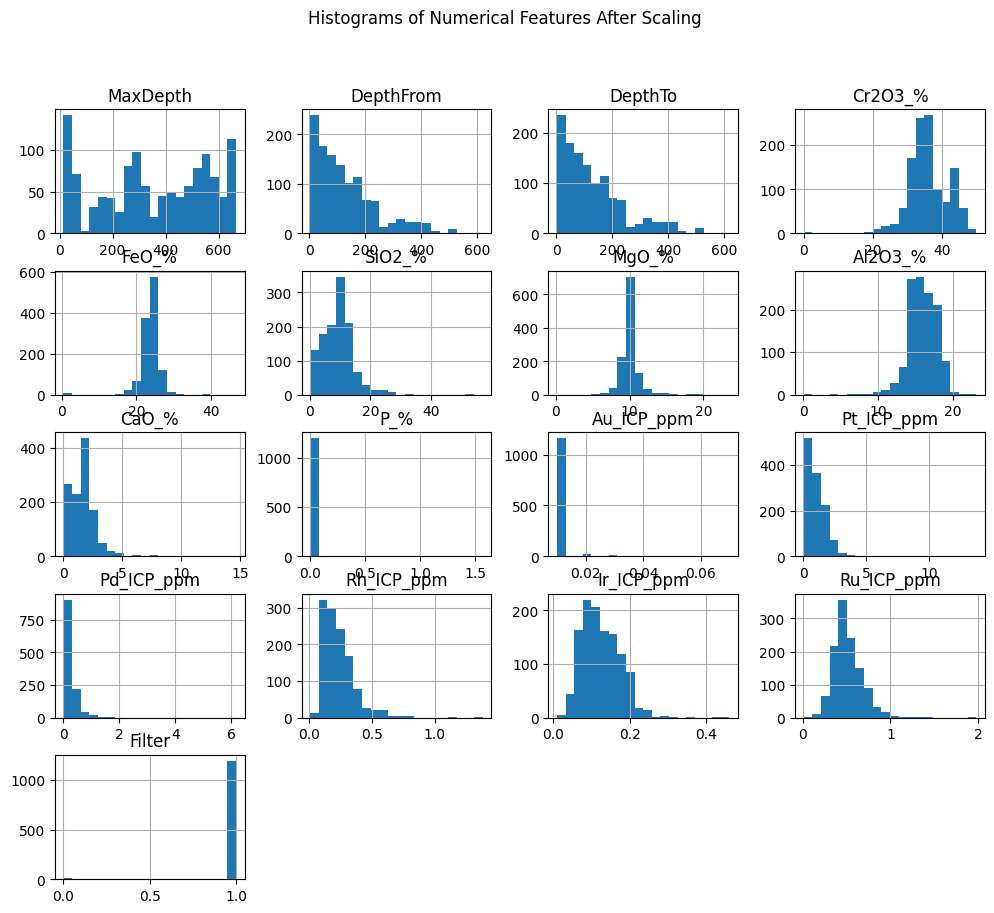

In [ ]:
# Plot histograms before scaling
Thaba[numerical_features].hist(bins=20, figsize=(12, 10))
plt.suptitle("Histograms of Numerical Features Before Scaling")
plt.show()

# Plot histograms after scaling (using Thaba_imputed_df from step 1)
Thaba_imputed_df.hist(bins=20, figsize=(12, 10))
plt.suptitle("Histograms of Numerical Features After Scaling")
plt.show()

Thaba_scaled.describe

In [ ]:
pd.DataFrame(Thaba_scaled, columns=numerical_features).describe()

,MaxDepth,DepthFrom,DepthTo,Cr2O3_%,FeO_%,SiO2_%,MgO_%,Al2O3_%,CaO_%,P_%,Au_ICP_ppm,Pt_ICP_ppm,Pd_ICP_ppm,Rh_ICP_ppm,Ir_ICP_ppm,Ru_ICP_ppm,Filter
count,1205.000000,1.205000e+03,1205.000000,1.205000e+03,1.205000e+03,1.205000e+03,1.205000e+03,1205.000000,1.205000e+03,1.205000e+03,1.205000e+03,1.205000e+03,1.205000e+03,1.205000e+03,1.205000e+03,1.205000e+03,1.205000e+03
mean,0.000000,-9.434592e-17,0.000000,-9.434592e-17,8.844930e-17,0.000000e+00,-2.358648e-16,0.000000,-2.358648e-17,-1.326740e-17,3.589568e-16,9.434592e-17,-8.255268e-17,-2.122783e-16,2.594513e-16,-3.184175e-16,-3.125209e-16
std,1.000415,1.000415e+00,1.000415,1.000415e+00,1.000415e+00,1.000415e+00,1.000415e+00,1.000415,1.000415e+00,1.000415e+00,1.000415e+00,1.000415e+00,1.000415e+00,1.000415e+00,1.000415e+00,1.000415e+00,1.000415e+00
min,-1.648690,-1.156446e+00,-1.159742,-6.135224e+00,-7.895077e+00,-1.702032e+00,-6.344880e+00,-8.080722,-1.361393e+00,-6.369737e-02,-1.629595e-01,-1.150228e+00,-8.058140e-01,-1.741505e+00,-2.225610e+00,-2.929429e+00,-9.970791e+00
25%,-0.802837,-8.030882e-01,-0.802781,-5.460220e-01,-3.092906e-01,-6.859111e-01,-3.662772e-01,-0.607718,-6.708442e-01,-6.369737e-02,-1.629595e-01,-7.319540e-01,-4.694343e-01,-7.398646e-01,-8.574138e-01,-6.173531e-01,1.002929e-01
50%,0.002983,-2.458107e-01,-0.244967,-4.958446e-02,0.000000e+00,3.234756e-16,-8.612964e-02,0.000000,-1.803912e-16,-6.369737e-02,-1.629595e-01,-1.441092e-01,-2.553745e-01,-2.005199e-01,-7.558737e-02,-1.549379e-01,1.002929e-01
75%,0.903776,4.471692e-01,0.446902,6.146147e-01,4.245996e-01,4.704276e-01,1.685499e-01,0.712546,3.609163e-01,-6.369737e-02,-1.629595e-01,4.437355e-01,1.421651e-01,4.929234e-01,7.062391e-01,5.386849e-01,1.002929e-01
max,1.505661,4.488026e+00,4.479985,2.405213e+00,7.783794e+00,8.646743e+00,8.534774e+00,3.653831,1.050792e+01,3.434165e+01,1.403219e+01,1.431461e+01,1.803145e+01,8.814242e+00,6.569938e+00,8.457546e+00,1.002929e-01


Thaba.describe

In [ ]:
Thaba.describe()

,MaxDepth,DepthFrom,DepthTo,Cr2O3_%,FeO_%,SiO2_%,MgO_%,Al2O3_%,CaO_%,P_%,Au_ICP_ppm,Pt_ICP_ppm,Pd_ICP_ppm,Rh_ICP_ppm,Ir_ICP_ppm,Ru_ICP_ppm,Filter
count,1205.000000,1205.000000,1205.000000,1126.000000,1125.000000,1126.000000,1126.000000,1125.000000,1126.000000,1125.000000,1205.000000,1205.000000,1205.000000,1205.000000,1205.000000,1205.000000,1205.000000
mean,354.993793,129.194871,129.770896,35.849654,23.744524,9.496661,10.135275,15.922178,1.705746,0.002907,0.010689,1.057477,0.273510,0.236025,0.123867,0.516805,0.990041
std,206.670294,109.254857,109.329033,6.045757,3.061533,5.683370,1.625486,2.031183,1.273920,0.047248,0.004229,0.884955,0.327147,0.129841,0.051183,0.173077,0.099335
min,14.400000,2.900000,3.030000,0.010000,0.400000,0.150000,0.170000,0.070000,0.030000,0.000000,0.010000,0.040000,0.010000,0.010000,0.010000,0.010000,0.000000
25%,189.140000,41.490000,42.040000,32.350000,22.720000,5.347500,9.500000,14.680000,0.810000,0.000000,0.010000,0.410000,0.120000,0.140000,0.080000,0.410000,1.000000
50%,355.610000,102.350000,103.000000,35.065000,23.930000,9.495000,9.940000,16.040000,1.660000,0.000000,0.010000,0.930000,0.190000,0.210000,0.120000,0.490000,1.000000
75%,541.700000,178.030000,178.610000,39.980000,25.110000,12.320000,10.430000,17.400000,2.220000,0.000000,0.010000,1.450000,0.320000,0.300000,0.160000,0.610000,1.000000
max,666.040000,619.330000,619.360000,49.900000,46.760000,56.980000,23.540000,23.090000,14.640000,1.570000,0.070000,13.720000,6.170000,1.380000,0.460000,1.980000,1.000000


This dataset, with 1205 samples, is the largest dataset I have worked with to date. Any mention of a "large dataset" in this context refers to this being my largest dataset, although it might be considered moderate or small in size compared to datasets used in other contexts.

In [ ]:
Thaba.shape

(1205, 23)

##Correlation Heat Map
####The Correlation Heat Map shows the relationship between each variable. If the number is closer to 1, there is a positive correlation. Values closer to -1 indicate a negative correlation, and values near zero show no correlation.
####We can see strong positive correlations around Depth, which is not surprising as they increase in intervals. Many rare earth elements also have good positive correlations. This is expected as Platinum Group Elements (PGEs) tend to concentrate together, leading to these correlations.
####We also see a few strongly negative correlated variables such as those with CaO, SiO, and Cr2O3. The relationships with CaO and SiO are common as these are base compounds in many rock types. The Thaba mine is a chromium mine, which explains the observed trends in the chromium compound.

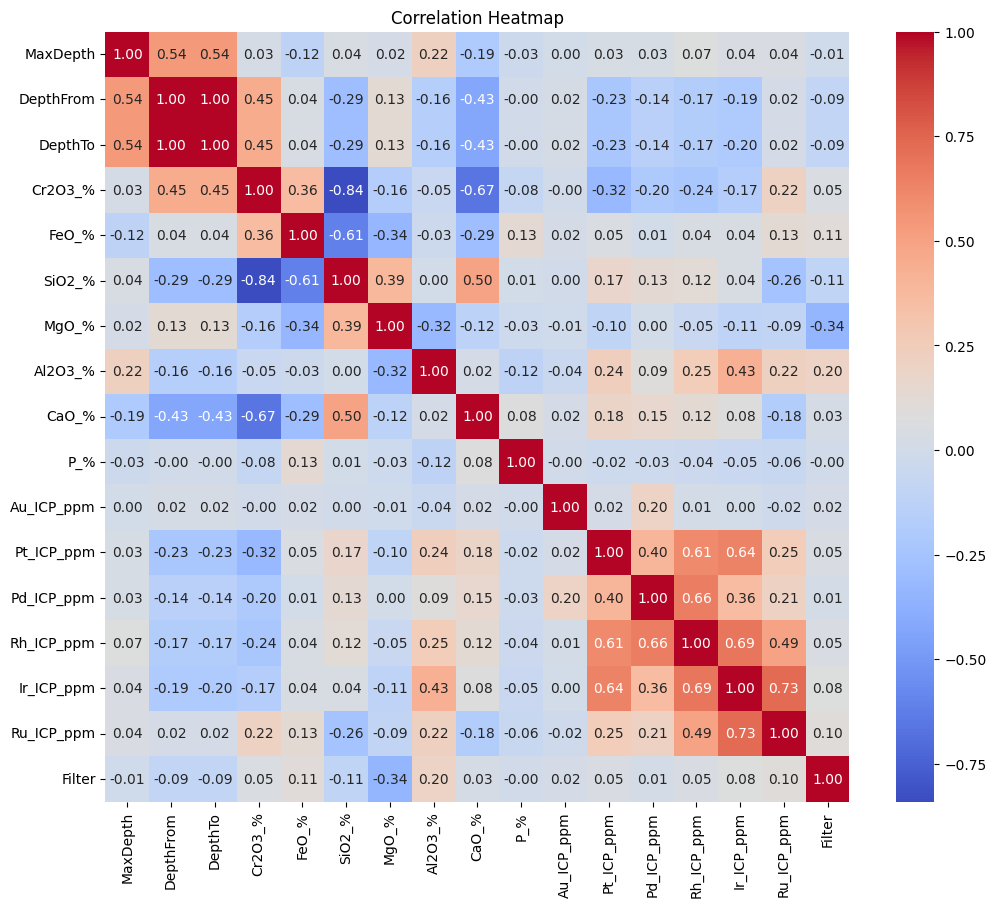

In [ ]:
# Calculate the correlation matrix, include only numerical features
correlation_matrix = Thaba.corr(numeric_only=True)

# Create a heatmap
plt.figure(figsize=(12, 10))  # Adjust figure size as needed
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

##CDF Plot
#### This plot provides a way to visualize the distribution of a dataset by showing the cumulative probability for each data point. Graphs that look diagonal with little change, such as, Max Depth, indicate a more evenly spread distribution of the data, typically resembling normal distribution or other balanced statistical distributions. Data sets that have a strictly vertical distribution of data mean that the data is not unique or many of the values are similar. With these two visualizations combined, you can get S-shaped curves where the start and end show significant changes but the values in the middle are relatively closer together.
#### This will allow us to identify data distribution patterns, helping to determine if the unsupervised model is grouping values in an unexpected or problematic way

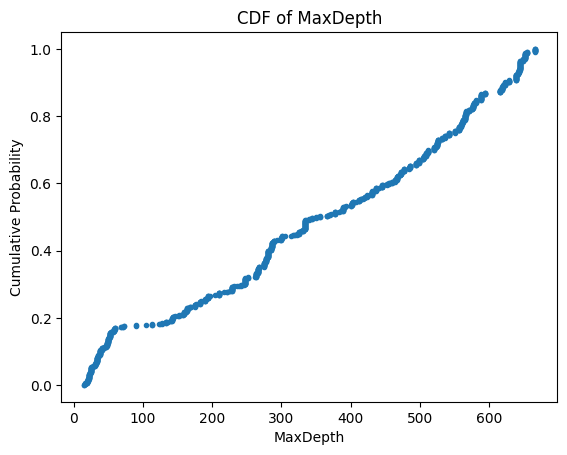

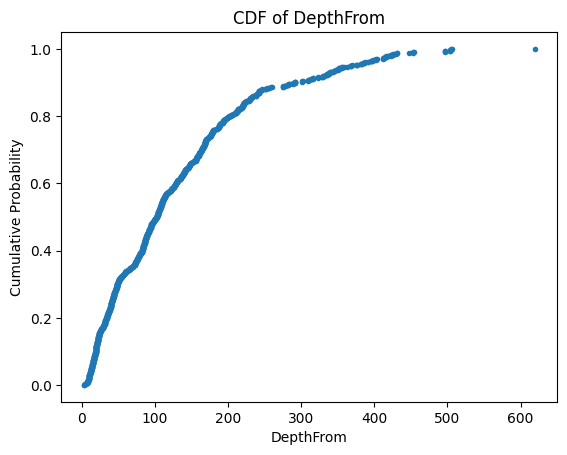

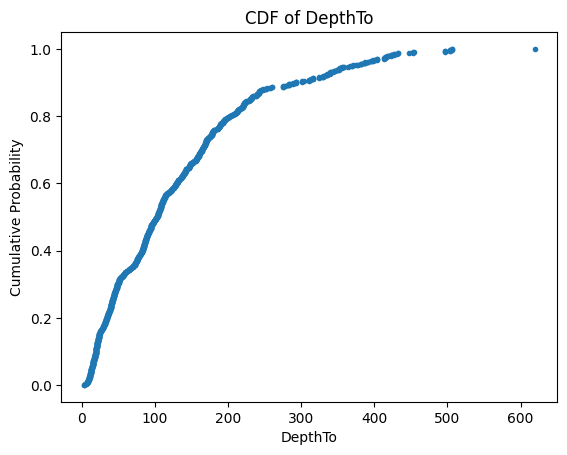

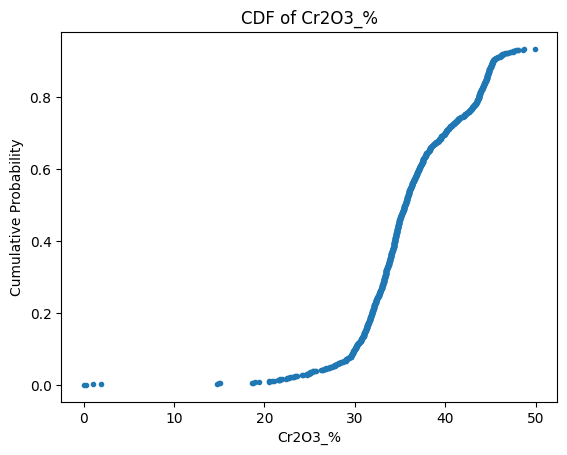

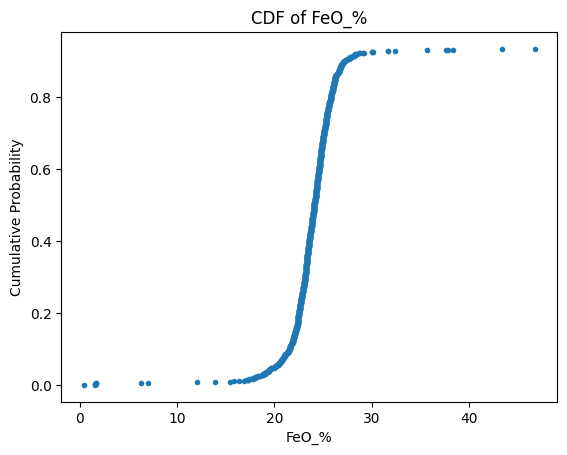

...

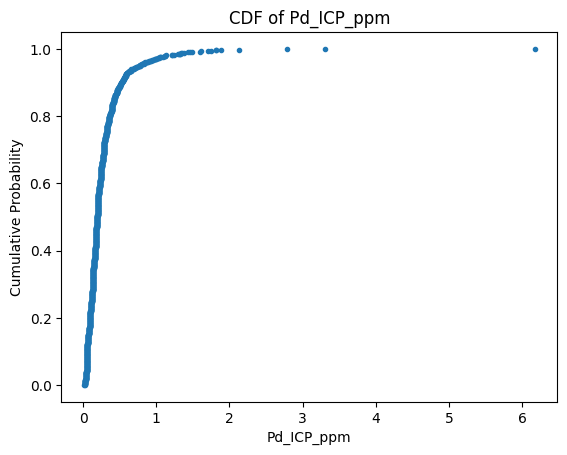

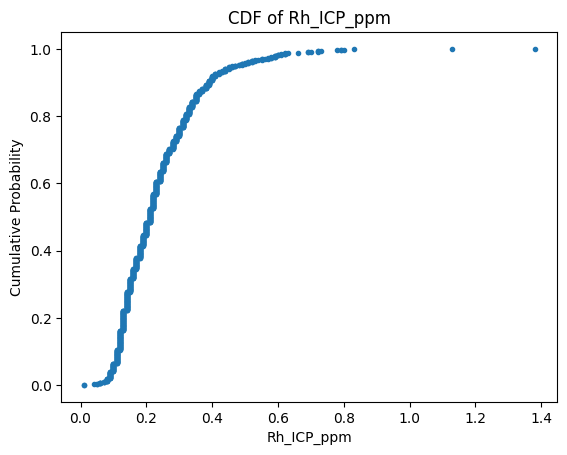

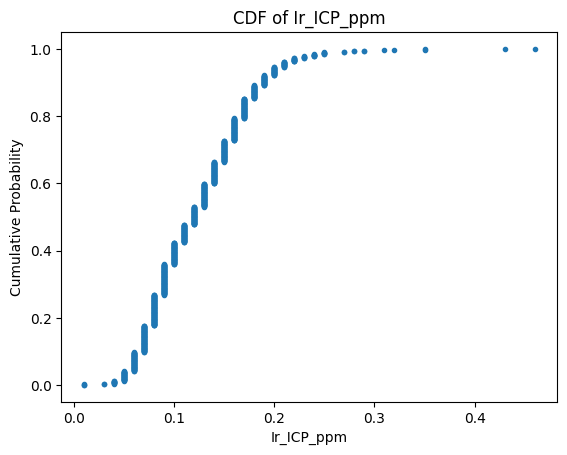

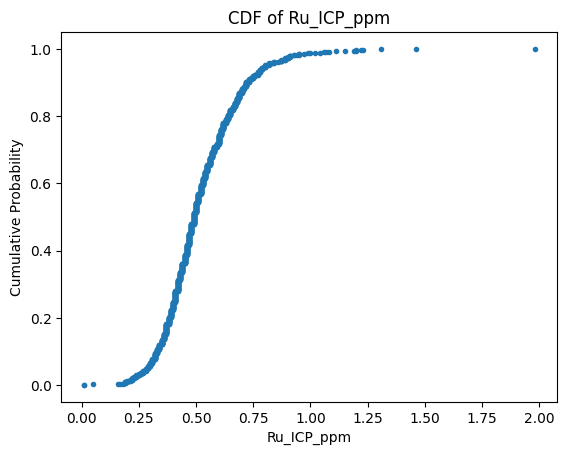

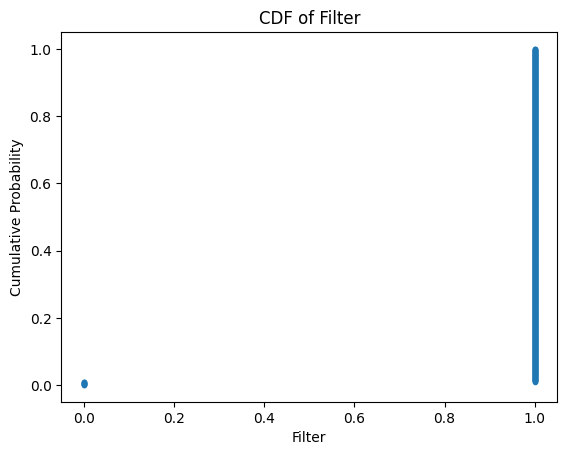

In [ ]:
# Get numerical features
numerical_features = Thaba.select_dtypes(include=np.number).columns

# Iterate through numerical features and plot CDFs
for feature in numerical_features:
    x = np.sort(Thaba[feature])
    y = np.arange(1, len(x) + 1) / len(x)

    plt.plot(x, y, marker='.', linestyle='none')
    plt.xlabel(feature)
    plt.ylabel('Cumulative Probability')
    plt.title(f'CDF of {feature}')
    plt.show()

In [ ]:
numerical_features = Thaba.select_dtypes(include=np.number).columns
print(numerical_features)

Index(['MaxDepth', 'DepthFrom', 'DepthTo', 'Cr2O3_%', 'FeO_%', 'SiO2_%',
       'MgO_%', 'Al2O3_%', 'CaO_%', 'P_%', 'Au_ICP_ppm', 'Pt_ICP_ppm',
       'Pd_ICP_ppm', 'Rh_ICP_ppm', 'Ir_ICP_ppm', 'Ru_ICP_ppm', 'Filter'],
      dtype='object')


#KMeans:
###Below is the KMeans clustering using the elbow method to identify the optimal number of clusters for the data. This is accompanied by a pair plot of the Thaba dataset to visualize clusters in each section.


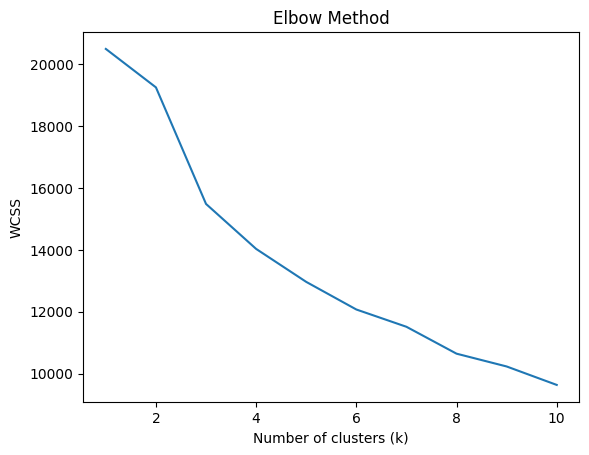

In [ ]:
# Apply KMeans Clustering
kmeans = KMeans(n_clusters=3)  # Adjust the number of clusters as needed
kmeans_labels = kmeans.fit_predict(Thaba_scaled)

wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(Thaba_scaled)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters (k)')
plt.ylabel('WCSS')
plt.show()


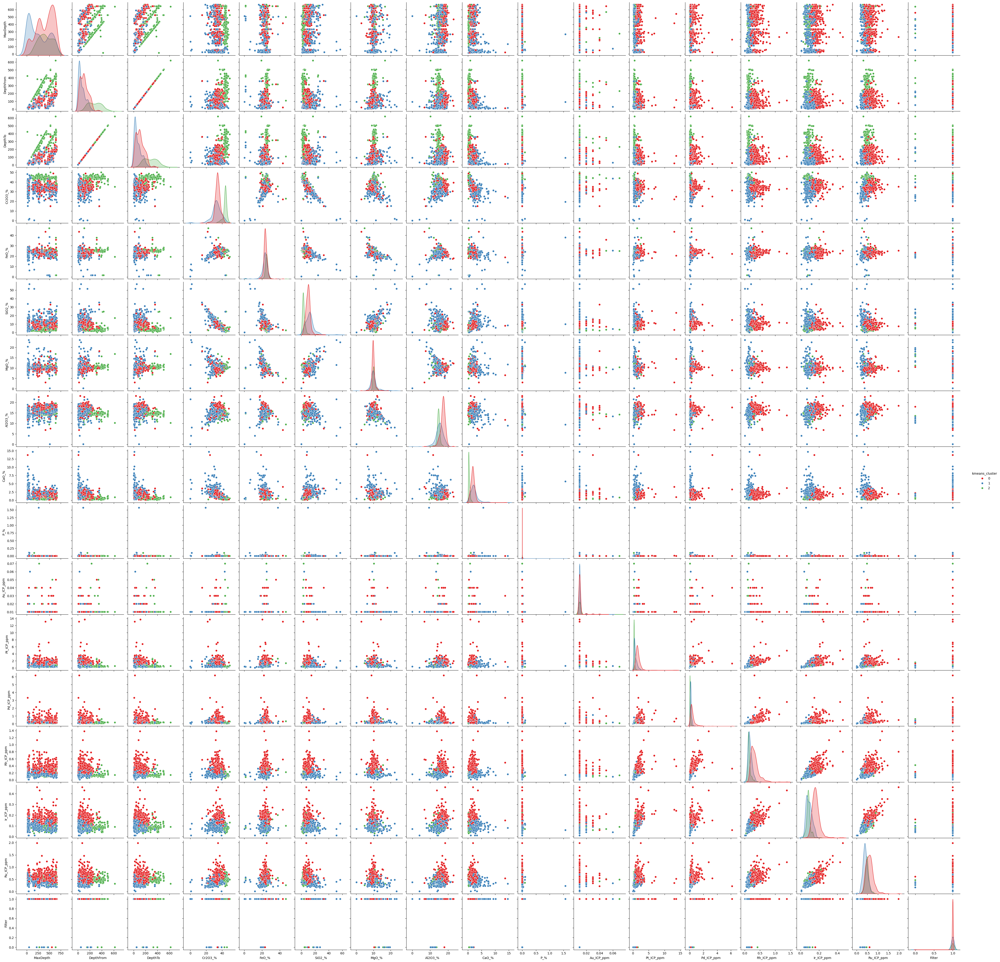

In [ ]:
Thaba['kmeans_cluster'] = kmeans_labels  # Add cluster labels to your DataFrame

# Create the pair plot
sns.pairplot(Thaba, hue='kmeans_cluster', vars=numerical_features, palette='Set1')
plt.show()

In [ ]:
score = kmeans.score(Thaba_scaled)
print(f"KMeans score: {score}")

KMeans score: -9638.508356432842


The plots above show the KMeans clustering for each variable together. We can see that the clusters are relatively the same between the depth variables and concentrations. This can easily be seen in the PGEs where the model is separating out the variables into three groups: low ppm and shallow depth, low ppm and deep depth, and high ppm and shallow depth. With a little fine-tuning, this model could possibly be used to help identify grade cutoffs in certain boreholes and allow geologists to quickly identify these holes for future prospects.

One issue this encounters is the KMeans score being so low. The closer that value is to 1, the less noisy the data is. Being at below -9600 would want me to look into other methods that may break the noise

#PCA:
###PCA is used to visualize the clusters identified by KMeans in a lower-dimensional space. By plotting the data points along the first few principal components, cluster separation and potential patterns can be observed.

PCA KMeans score: -15713.50584156542


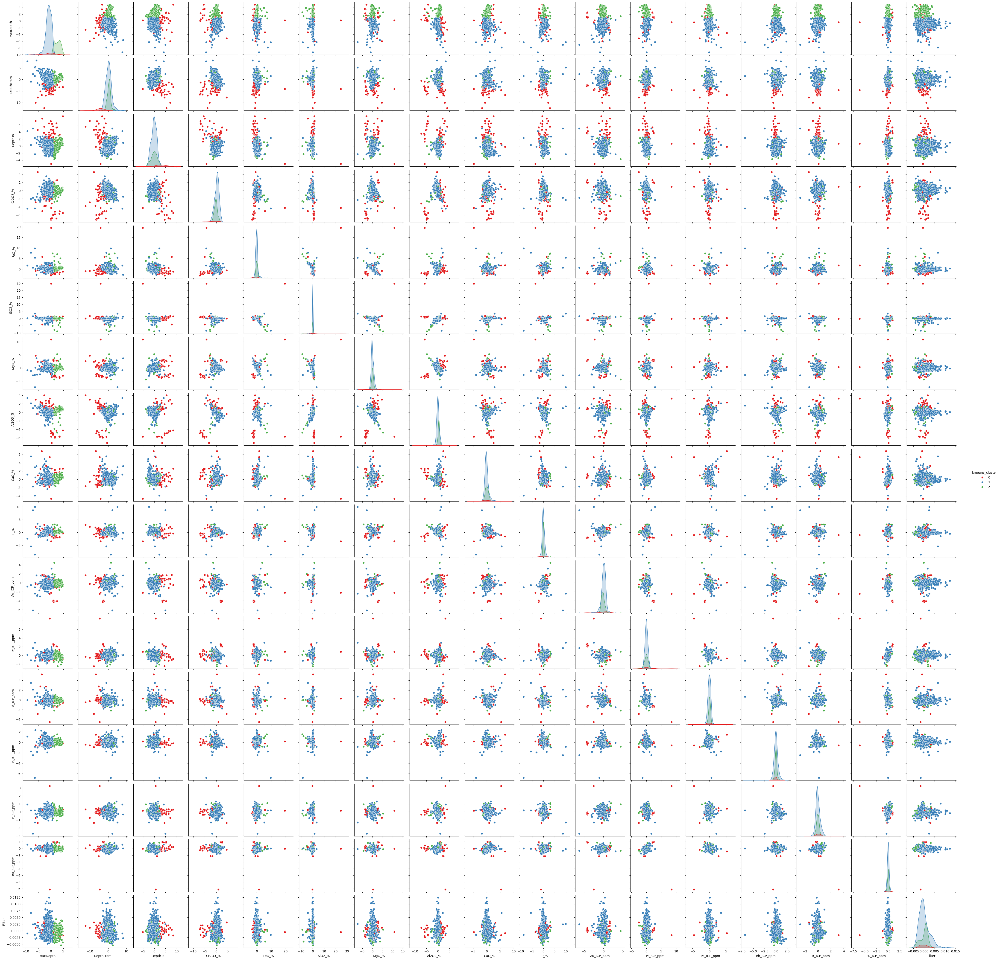

In [8]:
# Select numerical features and impute missing values
numerical_features = Thaba.select_dtypes(include=np.number).columns

if 'kmeans_cluster' in numerical_features:
    numerical_features = numerical_features[numerical_features != 'kmeans_cluster']
imputer = SimpleImputer(strategy='mean')
Thaba_imputed = imputer.fit_transform(Thaba[numerical_features])

# Standardize the data
scaler = StandardScaler()
Thaba_scaled = scaler.fit_transform(Thaba_imputed)

# Apply PCA with all components (to preserve original variables)
pca = PCA(n_components=Thaba_scaled.shape[1])  # Use all components
pca_result = pca.fit_transform(Thaba_scaled)

# Create a DataFrame with original variable names
pca_df = pd.DataFrame(data=pca_result, columns=numerical_features)

# Apply KMeans clustering with 3 clusters
kmeans = KMeans(n_clusters=3)
kmeans_labels = kmeans.fit_predict(pca_result)
pca_df['kmeans_cluster'] = kmeans_labels

# Score the PCA using KMeans score
score = kmeans.score(pca_result)
print(f"PCA : {score}")

# Visualize the clusters (optional) - This might be less informative with many variables
# You can select a subset of variables for visualization if needed
sns.pairplot(pca_df, hue='kmeans_cluster', vars=numerical_features, palette='Set1')
plt.show()

The plots above are showing a PCA clustering of the data. This clustering is supposed to reduce some of the noise that we see and also shows that 2 clusters are more beneficial. I chose three clusters to keep in line with the KMeans, but it doesn't seem to affect the clusters all that much as 2 are predominantly seen. Looking at our depth and PGEs like we did for KMeans, we can see that there are 2 primary clusters that separate the values based on depth. We saw the same in KMeans, but this does not seem to show much for ppm of these elements. Something else we can notice is that some of these variables are mixed in the analysis, as the noise is still causing the cluster to overlap. We can see this in the PCA score being below -15,000.

#Gaussian Mixture Model:
###GMM is applied to the dataset to identify clusters. Visualizing the clusters using a pair plot provides insights into the underlying data structure and reveals potential distinct groups within the borehole data. identifies any distinct groups within the borehole data.

AIC: 2507.779670203886
BIC: 5116.02791131736


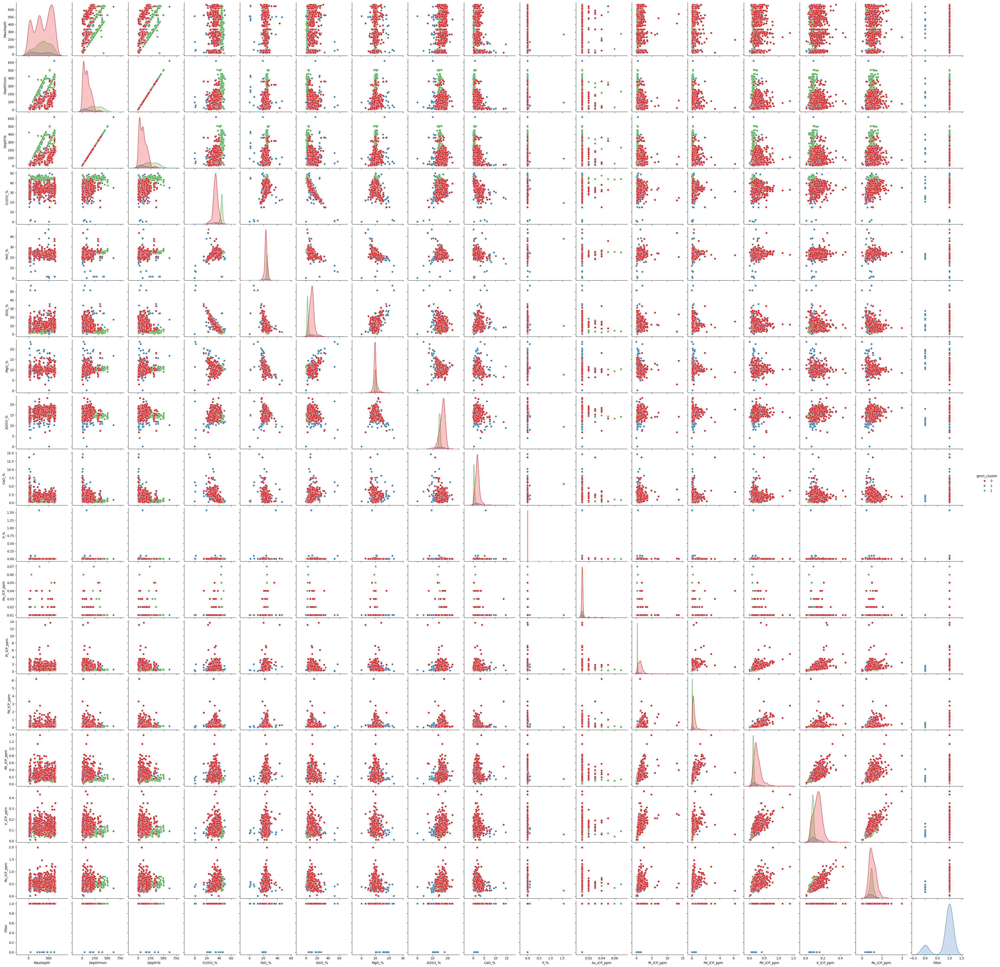

In [9]:
# Define your numerical features
numerical_features = Thaba.select_dtypes(include=np.number).columns
numerical_features = numerical_features[numerical_features != 'kmeans_cluster']  # Exclude 'kmeans_cluster'

# Apply Gaussian Mixture Model
gmm = GaussianMixture(n_components=3, random_state=42)  # Adjust n_components as needed
gmm_labels = gmm.fit_predict(Thaba_scaled)

# Add the cluster labels to your DataFrame
Thaba['gmm_cluster'] = gmm_labels

# Compute AIC and BIC scores
aic = gmm.aic(Thaba_scaled)
bic = gmm.bic(Thaba_scaled)

print(f"AIC: {aic}")
print(f"BIC: {bic}")

# Visualize the clusters (pair plot)
sns.pairplot(Thaba, hue='gmm_cluster', vars=numerical_features, palette='Set1')
plt.show()



The plots above are showing a GMM model of the data. This clustering is supposed to cluster data with a normal distribution; therefore, it can capture different shapes and sizes. It can also let different points in a variable be assigned to different groups, giving this a unique visualization of the data that is less structured. Using our PGEs and depth again, we see a significant grouping, separating the values into shallow and deep depths. This was also scored using the AIC (Akaike Information Criterion) and BIC (Bayesian Information Criterion) methods, both of which should be close to 0 but have values above 2000. This once again means the data is fitting poorly to the model, or the data is of high complexity.


#Discussion Questions:

##Which method did you like the most?
###My preferred method was GMM because it provided a relatively simple view of the data and had the best scoring fit compared to the other models. It also confirmed that the model is segmenting each variable similarly.

##Which method did you like the least?
###I did not like the PCA model because it seemed less informative than K-means clustering and more complex than the GMM. The scoring of the model was also the worse of the three.

## How did you score these unsupervised models?
### I scored the kmeans and PCA with the Kmeans.score method. I used the AIC and BIC scoring methods for the GMM.

##Did the output align with your geologic understanding?
### The output for some of the graphs, such as those showing "depth from" and various concentrations, aligned with my geological understanding. The graphs depicting correlation between PGEs also made sense because the generally form together.



##What did you want to learn more about?
### I would like to see which variables the models are using to create the clusters. This would help give me insight into how to better interpret the data.

##Did you pre-process your data?
###Yes, the data was preprocessed by extracting only the numerical features and then scaling them for use in the KMeans method. Additionally, a correlation heatmap and CDF plots were created to identify trends in the data.

##What was a decision you were most unsure about?
###Due to my limited domain knowledge, choosing appropriate models for this dataset was challenging. Therefore, I randomly selected a few from the list to explore and analyze.